# Data Analysis

# Part 1: Clustering songs based on lyrics

To cluster songs based on lyrics, we used scikit learn to create a tf-idf matrix and a Kmeans cluster model. To visualize these clusters, we decided to group together the lyrics belonging to each cluster and feed those to an online word cloud generator (https://www.wordclouds.com/). (See result in Presentation notebook)



In [1]:
import json
import requests
from time import sleep
import pandas as pd
from pandas.io.json import json_normalize
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np
from altair import *

In [3]:
tracks = pd.read_csv("/data301/share/final_tracks.csv")
song_lyrics = pd.read_csv("/data301/share/song_lyrics.csv")

In [3]:
# drop latin tracks from clusters, only want english words
song_lyrics["latin"] = tracks.latin
song_lyrics = song_lyrics[song_lyrics.latin == False]
song_lyrics = song_lyrics.drop("latin", axis=1)

In [4]:
# a little cleaning we forgot to do earlier
song_lyrics = song_lyrics.drop("Unnamed: 0", axis=1)
song_lyrics = song_lyrics.fillna("")
song_lyrics.lyrics = song_lyrics.lyrics.str.replace("\n", " ")
song_lyrics.lyrics = song_lyrics.lyrics.str.replace("\'", "")
song_lyrics.lyrics = song_lyrics.lyrics.str.lower()
song_lyrics.lyrics = song_lyrics.lyrics.str.replace("[^\w\s]", "")

In [5]:
# remove songs with no lyrics
train_lyrics = song_lyrics[song_lyrics.lyrics != ""]
train_lyrics = train_lyrics.reset_index()

In [6]:
# create tf-idf vector without stopwords
# ignore terms that appear in more than 50% of song lyrics to get rid of more meaningless words
vec = TfidfVectorizer(norm=None, stop_words='english', max_df=0.5) 
vec.fit(train_lyrics["lyrics"]) # fit to lyrics
X_sparse = vec.transform(train_lyrics["lyrics"])

In [7]:
# create dataframe
tf_lyrics = pd.DataFrame(X_sparse.todense())
tf_lyrics["song_index"] = train_lyrics["song_index"]
#tf_lyrics.to_csv("tf_idf_lyrics.csv")

In [8]:
num_clusters = 6
model = KMeans(n_clusters=num_clusters)
model.fit(X_sparse)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [9]:
# print top terms in each cluster
print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vec.get_feature_names()
for i in range(0, num_clusters):
    print("Cluster %d:" % i)
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind])
    print

Top terms per cluster:
Cluster 0:
 heartbreak
 dedicate
 realise
 daylight
 cure
 sees
 girl
 tight
 going
 hurt
Cluster 1:
 yeah
 bitch
 nigga
 niggas
 fuck
 ooh
 shit
 aint
 money
 lil
Cluster 2:
 drip
 drippin
 came
 sweat
 wrist
 diamonds
 ice
 bitch
 mommy
 make
Cluster 3:
 cardi
 21
 offset
 upset
 bitch
 cartier
 brain
 body
 bardi
 lane
Cluster 4:
 love
 oh
 baby
 youre
 yeah
 want
 wanna
 cause
 girl
 let
Cluster 5:
 na
 uoh
 que
 kissing
 strangers
 tú
 te
 una
 oooh
 tight


In [10]:
cluster_lyrics_list = [""] * num_clusters # get lyrics of songs into list for each cluster
cluster_numsongs_list = [0] * num_clusters # get count of songs in each cluster
for i in range(0, len(model.labels_)): 
    cluster_lyrics_list[model.labels_[i]] += train_lyrics.lyrics[i]
    cluster_numsongs_list[model.labels_[i]] += 1

In [11]:
import string, re

# remove punctuation from words
lyrics_count_list = [[]] * num_clusters
for i in range(0, num_clusters):
    lyrics = cluster_lyrics_list[i]
    lyrics_list = []
    for word in lyrics.split(" "):
        word = re.sub(r'[^\w\s]','', word)
        lyrics_list.append(word)
    lyrics_count_list[i] = lyrics_list

In [12]:
# save lyrics for each cluster into txt file for wordcloud generator
import pickle
#pickle.dump(cluster_lyrics_list[5], open("cluster5.txt", "wb"))

In [13]:
# create and save final dataframe with song info and matching lyrics
final_tracks = pd.read_csv("saved_csvs/final_tracks.csv")
# merging the files takes a long time!
#final_tracks = final_tracks.merge(tf_lyrics, left_on="Unnamed: 0", right_on="song_index", how="left")
#final_tracks.head()
#final_tracks.to_csv("final_tracks_lyrics.csv")

# Part 2: Audio feature visualizations

For this part we used Altair to generate multiple types of visualizations displaying the correlation between different audio features and the popularity of these songs. Sadly Altair only takes 5000 rows of a data frame, however we only had slightly over 5000 songs with distinct genres, so we figured it was fine to just take the first 5000 tracks.

In [4]:
# drop tracks with null and "other" genres
tracks_genre = tracks[~tracks.main_genre.isnull()]
tracks_genre = tracks_genre[~ (tracks.main_genre == "other")]
tracks_genre.rename(columns={'main_genre':'main genre'}, inplace=True)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


**What are the most popular genres?**

In [ ]:
Chart(tracks_genre[:5000]).mark_bar().encode(
    x="main genre",
    y="count()",
    color="main genre"
)

It's clear that the vast majority of popular songs fall in the pop genre, with over 2,000 songs. Hip hop falls behind with just over 1,000 songs. 

**Are more popular songs more danceable?**

In [ ]:
Chart(tracks_genre[:5000]).mark_circle().encode(
    x="danceability",
    y="popularity",
    column = "main genre",
    color="energy"
)

From the scatterplots, we can see that most genres, except for maybe alternative, have clusters near the top right corner of plot, meaning most popular songs are more danceable. The energy color also shows that most songs with higher danceability have higher energy, which makes sense.

**Are more positive songs more popular?**

In [ ]:
Chart(tracks_genre[:5000]).mark_circle().encode(
    x="valence",
    y="popularity",
    column="main genre",
    color="danceability"
)

These scatterplots somewhat surprised us because we thought that the majority of popular songs would have higher valences, however the graphs show that the popularity of a song doesn't seem to be dependent on its valence. The danceability also didnt really align with songs of higher valence as we expected it would.

**Which genres are the most speechy?**

In [ ]:
# which genres are the most 'speechy'?
Chart(tracks_genre[:5000]).mark_circle().encode(
    x="speechiness",
    y="popularity",
    column="main genre",
    color="danceability"
)

From these scatterplots we can see that hip hop clearly has the most 'speechy' songs, as we would expect, while country, house, pop, rock, and soul songs generally have very low speech scores.

In [5]:
# focus on just the top 3 genres
tracks_top_genre = tracks_genre[(tracks_genre["main genre"] == "pop") | 
                                (tracks_genre["main genre"] == "hip hop") |
                                (tracks_genre["main genre"] == "country")]
len(tracks_top_genre) # number of songs left

4322

**A closer look at speechiness vs genre for the top 3 genres**

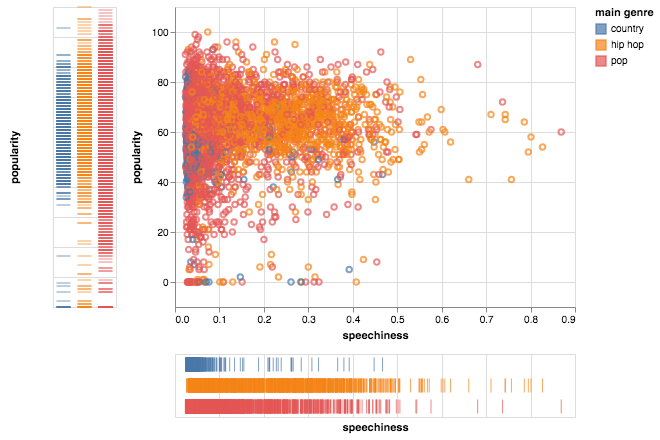

In [6]:
import altair as alt

brush = alt.selection(type='interval')

tick_axis = alt.Axis(labels=False, domain=False, ticks=False)
tick_axis_notitle = alt.Axis(labels=False, domain=False, ticks=False, title='')

points = alt.Chart(tracks_top_genre).mark_point().encode(
    x = alt.X('speechiness', scale=alt.Scale(zero=False)),
    y = alt.Y('popularity', scale=alt.Scale(zero=False, padding=1)),
    color = alt.condition(brush, "main genre", alt.value('grey'))
).properties(
    selection=brush
)

x_ticks = alt.Chart(tracks_top_genre).mark_tick().encode(
    alt.X('speechiness', axis=tick_axis),
    alt.Y('main genre', axis=tick_axis_notitle),
    color=alt.condition(brush, 'main genre', alt.value('lightgrey'))
).properties(
    selection=brush
)

y_ticks = alt.Chart(tracks_top_genre).mark_tick().encode(
    alt.X('main genre', axis=tick_axis_notitle),
    alt.Y('popularity', axis=tick_axis),
    color=alt.condition(brush, 'main genre', alt.value('lightgrey'))
).properties(
    selection=brush
)

y_ticks | (points & x_ticks)

Again we can see that hip hop is clearly the most speechy, while country is the least speechy. We can  also see that most hip hop songs cluster in the 40-80 range of popularity, while there are a lot of pop songs clustered between the popularity range of 20-100. Because we can see here that a lot of the pop songs score low on speechiness, we can assume that speechiness probably has an effect on the popularity of hip hop songs, but not so much on pop songs.

**Are louder songs more popular?**

In [ ]:
import altair as alt

alt.Chart(tracks_genre[:5000]).mark_rect().encode(
    alt.X('loudness', bin=alt.Bin(maxbins=10)),
    alt.Y('popularity', bin=alt.Bin(maxbins=10)),
    alt.Color('energy', scale=alt.Scale(scheme='greenblue')),
    alt.Column("main genre")
)

From these plots we can see that most genres have a loudness clustered between -15 and 0 decibels. It seems as though most genres have clusters in the top right corner, showing that louder songs are generally more popular. We can see from the colors that the louder the song, the more energy it has. 